# Approach:
1. Take title, abstract and text to cteate documnet
2. Simple preprocessing of documents
3. Find key words for each document. 
4. Calculate key words for each query sentence.
5. Calculate distance between query sentence and each document and select closest match as result


In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import json
import math
import glob

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from nltk.stem.snowball import SnowballStemmer
from scipy.spatial import distance
from matplotlib import pyplot as plt
from wordcloud import WordCloud
import ipywidgets as widgets

from IPython.display import Image
from IPython.display import display, HTML

# Load data into DF
In this part we will load data from both summary csv file and all availiable text / abstracts from additional .json files

In [2]:
root_dir = '/home/niharika/Documents/covid2/2020-04-17'


In [3]:
df = pd.read_csv(f'{root_dir}/metadata.csv')
doc_paths = glob.glob(f'{root_dir}/*/*/*.json')
df.sha.fillna("", inplace=True)

#get text for articles that are available
def get_text(sha):
    if sha == "":
        return ""
    document_path = [x for x in doc_paths if sha in x]
    if not document_path:
        return ""
    with open(document_path[0]) as f:
        file = json.load(f)
        full_text = []
        #iterate over abstract and body part
        for part in ['abstract', 'body_text']:
            # iterate over each paragraph
            for text_part in file[part]:
                text = text_part['text']
                # remove citations from each paragraph
                for citation in text_part['cite_spans']:
                    text = text.replace(citation['text'], "")
                full_text.append(text)
            
        return str.join(' ', full_text)
%time df['text'] = df.apply(lambda x: get_text(x.sha), axis=1)

CPU times: user 21.1 s, sys: 435 ms, total: 21.5 s
Wall time: 31.5 s


# Preprocessing data

preprocess text. First change all letters to lower case, then we apply stemming and remove stopwords afterwards. 

(note) Lemmatization is also valid approach, and might increase accuracy later on, but it could also reduce accuracy. 

In [4]:
analyzer = CountVectorizer().build_analyzer()
stemmer = SnowballStemmer("english")

def preprocess(doc):
    doc=doc.lower()
    return str.join(" ", [stemmer.stem(w) for w in analyzer(doc)])

def preprocess_row(row):
    text = str.join(' ', [str(row.title), str(row.abstract), str(row.text)])
    return preprocess(text)

%time df['preprocessed'] = df.apply(lambda x: preprocess_row(x), axis=1)

CPU times: user 4min 51s, sys: 810 ms, total: 4min 52s
Wall time: 4min 52s


# Apply TF-IDF
Calculate number of words then use TF_IDF approach.
- TF(w) = (Number of times term w appears in a document) / (Total number of terms in the document)
- IDF(w) = log_e(Total number of documents / Number of documents with term w in it)

In [5]:
cv = CountVectorizer(max_df=0.95, stop_words='english')
%time word_count = cv.fit_transform(df.preprocessed)
tfidf_tr = TfidfTransformer(smooth_idf=True, use_idf=True)
%time tfidf_tr.fit(word_count)

CPU times: user 15.6 s, sys: 192 ms, total: 15.8 s
Wall time: 15.9 s
CPU times: user 40.4 ms, sys: 12 ms, total: 52.4 ms
Wall time: 68.9 ms


TfidfTransformer()

# create word vector for all documents

In [6]:
def get_word_vector(document):
    w_vector = tfidf_tr.transform(cv.transform([document]))
    return w_vector 

%time df['word_vector'] = df.preprocessed.apply(get_word_vector)

CPU times: user 2min 36s, sys: 744 ms, total: 2min 37s
Wall time: 2min 40s


calcululate distance between each document and the searching document(phrase) using only words that were in query documnet(phrase)

# Calculate distance between searching phrase and each document

In [9]:
def show_word_cloud(word_vector):
    cloud = WordCloud(background_color='white',
        width=500,
        height=500,
        max_words=20,
        colormap='tab10',
        prefer_horizontal=1.0)
    word_frequency = dict(get_words_with_value(word_vector))
    cloud.generate_from_frequencies(word_frequency)
    plt.gca().imshow(cloud)
    plt.gca().axis('off')

feature_names = cv.get_feature_names()
def get_words_with_value(w_vector):
    return sorted([(feature_names[ind], val) for ind, val in zip(w_vector.indices, w_vector.data)], key=lambda x: x[1], reverse=True)

In [10]:
def calculate_distance_between_words_vectors(search_words_indices, search_vec, document_vector):
    document_vec = document_vector[0, search_words_indices].toarray()
    return distance.euclidean(search_vec, document_vec)

def get_related_documents(text, number_of_documents):    
    search_vector = get_word_vector(preprocess(text))
    search_words_indices = search_vector.indices
    search_vec = search_vector[0, search_words_indices].toarray()
    distance_idx = df.apply(lambda x: calculate_distance_between_words_vectors(search_words_indices, search_vec, x.word_vector), axis=1)
    relevant_indexes = distance_idx.sort_values().head(number_of_documents).index 
    result_columns = ["title", "doi", "pmcid", "pubmed_id", "license", "authors", "word_vector"]
    result = df[result_columns].iloc[relevant_indexes].fillna("")
    return result

In [11]:
tasks = {
    "What do we know about virus genetics, origin, and evolution?":
    [
        "Real-time tracking of whole genomes and a mechanism for coordinating the rapid dissemination of that information to inform the development of diagnostics and therapeutics and to track variations of the virus over time.",
        "Access to geographic and temporal diverse sample sets to understand geographic distribution and genomic differences, and determine whether there is more than one strain in circulation. Multi-lateral agreements such as the Nagoya Protocol could be leveraged.",
        "Evidence that livestock could be infected (e.g., field surveillance, genetic sequencing, receptor binding) and serve as a reservoir after the epidemic appears to be over.",
        "Evidence of whether farmers are infected, and whether farmers could have played a role in the origin.",
        "Surveillance of mixed wildlife- livestock farms for SARS-CoV-2 and other coronaviruses in Southeast Asia.",
        "Experimental infections to test host range for this pathogen.",
        "Animal host(s) and any evidence of continued spill-over to humans",
        "Socioeconomic and behavioral risk factors for this spill-over",
        "Sustainable risk reduction strategies"
    ],
    "What do we know about diagnostics and surveillance?":
    [
        "How widespread current exposure is to be able to make immediate policy recommendations on mitigation measures. Denominators for testing and a mechanism for rapidly sharing that information, including demographics, to the extent possible. Sampling methods to determine asymptomatic disease (e.g., use of serosurveys (such as convalescent samples) and early detection of disease (e.g., use of screening of neutralizing antibodies such as ELISAs).",
        "Efforts to increase capacity on existing diagnostic platforms and tap into existing surveillance platforms.",
        "Recruitment, support, and coordination of local expertise and capacity (public, private—commercial, and non-profit, including academic), including legal, ethical, communications, and operational issues.",
        "National guidance and guidelines about best practices to states (e.g., how states might leverage universities and private laboratories for testing purposes, communications to public health officials and the public).",
        "Development of a point-of-care test (like a rapid influenza test) and rapid bed-side tests, recognizing the tradeoffs between speed, accessibility, and accuracy.",
        "Rapid design and execution of targeted surveillance experiments calling for all potential testers using PCR in a defined area to start testing and report to a specific entity. These experiments could aid in collecting longitudinal samples, which are critical to understanding the impact of ad hoc local interventions (which also need to be recorded).",
        "Separation of assay development issues from instruments, and the role of the private sector to help quickly migrate assays onto those devices.",
        "Efforts to track the evolution of the virus (i.e., genetic drift or mutations) and avoid locking into specific reagents and surveillance/detection schemes.",
        "Latency issues and when there is sufficient viral load to detect the pathogen, and understanding of what is needed in terms of biological and environmental sampling.",
        "Use of diagnostics such as host response markers (e.g., cytokines) to detect early disease or predict severe disease progression, which would be important to understanding best clinical practice and efficacy of therapeutic interventions.",
        "Policies and protocols for screening and testing.",
        "Policies to mitigate the effects on supplies associated with mass testing, including swabs and reagents.",
        "Technology roadmap for diagnostics.",
        "Barriers to developing and scaling up new diagnostic tests (e.g., market forces), how future coalition and accelerator models (e.g., Coalition for Epidemic Preparedness Innovations) could provide critical funding for diagnostics, and opportunities for a streamlined regulatory environment.",
        "New platforms and technology (e.g., CRISPR) to improve response times and employ more holistic approaches to COVID-19 and future diseases.",
        "Coupling genomics and diagnostic testing on a large scale.",
        "Enhance capabilities for rapid sequencing and bioinformatics to target regions of the genome that will allow specificity for a particular variant.",
        "Enhance capacity (people, technology, data) for sequencing with advanced analytics for unknown pathogens, and explore capabilities for distinguishing naturally-occurring pathogens from intentional.",
        "One Health surveillance of humans and potential sources of future spillover or ongoing exposure for this organism and future pathogens, including both evolutionary hosts (e.g., bats) and transmission hosts (e.g., heavily trafficked and farmed wildlife and domestic food and companion species), inclusive of environmental, demographic, and occupational risk factors."
    ]
}

Helper functions for displaying everything

In [13]:
def display_friendly_results(df_result):
    display_columns = ["title", "doi", "pmcid", "pubmed_id", "authors"]
    display(df_result[display_columns].reset_index(drop=True))
    rows = math.ceil(len(df_result)/3)
    plt.rcParams["figure.figsize"] = (20,15)
    for i in range(len(df_result)):
        row = df_result.iloc[1]
        plt.subplot(rows, 3, i+1)
        show_word_cloud(row.word_vector)
        plt.title(f'Paper {i}', fontsize=20)
    plt.show()

def display_topics_results(task):
    for topic in tasks[task]:
        display(HTML(f"<h3>{topic}<h3>"))
        topic_result = get_related_documents(topic, 6)
        display_friendly_results(topic_result)

# What do we know about virus genetics, origin, and evolution?

,title,doi,pmcid,pubmed_id,authors
0,An interactive web-based dashboard to track CO...,10.1016/s1473-3099(20)30120-1,,,"Dong, Ensheng; Du, Hongru; Gardner, Lauren"
1,Tracking and visualization of space-time activ...,10.1186/1476-072x-12-6,PMC3579692,2.33881e+07,"Qi, Feng; Du, Fei"
2,Tracking Nosocomial Diseases at Individual Lev...,10.1007/s10916-018-1085-4,PMC7087895,3.0284e+07,"Cheng, Chun-Hung; Kuo, Yong-Hong; Zhou, Ziye"
3,A data driven time-dependent transmission rate...,10.1016/j.scib.2020.02.005,PMC7128746,,"Huang, Norden E.; Qiao, Fangli"
4,"Towards a genomics-informed, real-time, global...",10.1038/nrg.2017.88,PMC7097748,2.91299e+07,"Gardy, Jennifer L.; Loman, Nicholas J."
5,Tracking virus outbreaks in the 21st century,10.1038/s41564-018-0296-2,PMC6345516,3.05461e+07,"Grubaugh, Nathan D; Ladner, Jason T; Lemey, Ph..."


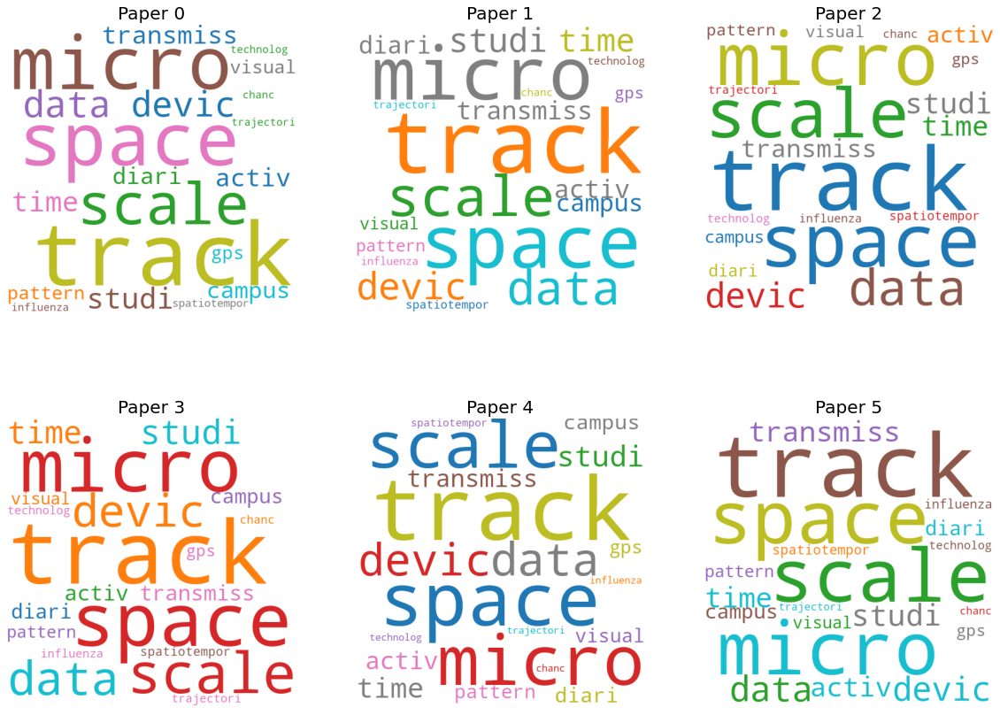

,title,doi,pmcid,pubmed_id,authors
0,La sécurité sanitaire mondiale à l’heure de Na...,10.1016/s0001-4079(19)30438-8,PMC7095175,,"Houssin, Didier"
1,Incorporating Geographical Contacts into Socia...,10.1007/978-3-540-72608-1_3,PMC7122638,,"Chen, Yi-Da; Tseng, Chunju; King, Chwan-Chuen;..."
2,A Cloud Based Epidemiology Network to Investig...,10.1093/ofid/ofx163.500,PMC7107180,,"Cook, Camille; Wallin, Andrew; Faucett, Aimie;..."
3,Severe Acute Respiratory Syndrome: Temporal St...,10.3201/eid0908.030334,PMC3020622,1.29675e+07,"Galvani, Alison P.; Lei, Xiudong; Jewell, Nich..."
4,Descriptive review of geographic mapping of se...,10.1186/1476-072x-3-2,PMC343293,1.47489e+07,"Boulos, Maged N Kamel"
5,Comparison of the geographical distribution of...,10.1186/1746-6148-9-2,PMC3544736,2.32894e+07,"Chhetri, Bimal K; Berke, Olaf; Pearl, David L;..."


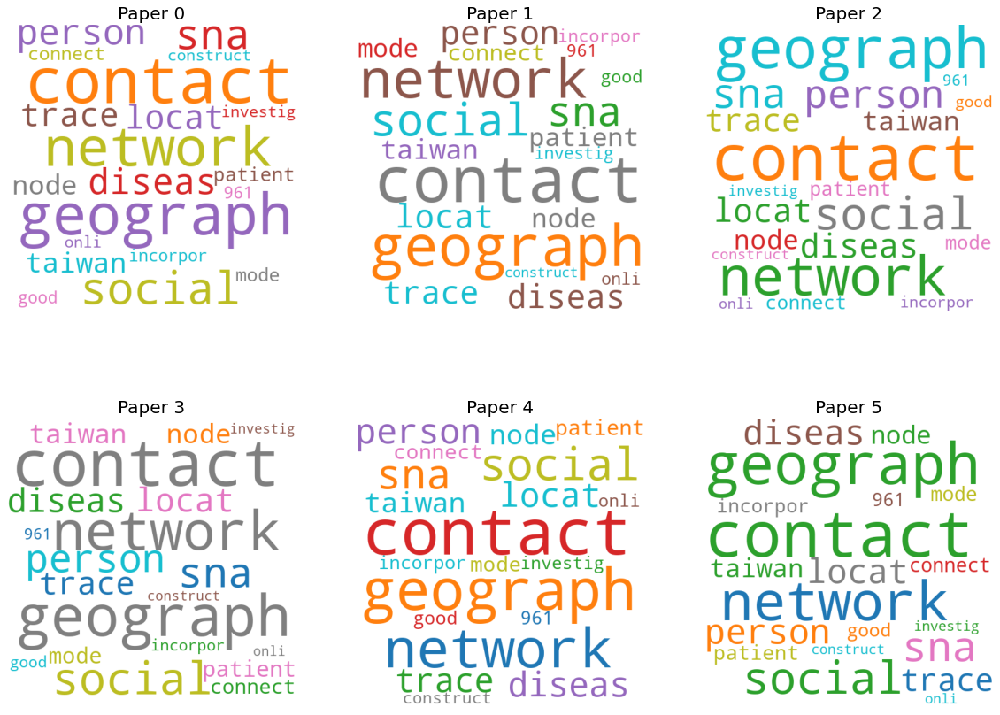

,title,doi,pmcid,pubmed_id,authors
0,An Ecological and Conservation Perspective on ...,10.3390/v3040379,PMC3185704,21994738.0,"Vandegrift, Kurt J.; Wale, Nina; Epstein, Jona..."
1,Pathogen genomic surveillance elucidates the o...,10.1007/s11427-017-9211-0,PMC7088571,29270793.0,"Shi, Weifeng; Li, Juan; Zhou, Hong; Gao, Georg..."
2,Predicting Reservoir Hosts and Arthropod Vecto...,10.1126/science.aap9072,PMC6536379,30385576.0,"Babayan, Simon A.; Orton, Richard J.; Streicke..."
3,Middle East Respiratory Syndrome Coronavirus I...,10.1371/journal.pone.0146251,PMC4720378,26790002.0,"Borucki, Monica K.; Lao, Victoria; Hwang, Mona..."
4,Discovery of Bat Coronaviruses through Surveil...,10.1128/msphere.00807-19,PMC6992374,31996413.0,"Li, Bei; Si, Hao-Rui; Zhu, Yan; Yang, Xing-Lou..."
5,Computational simulation of interactions betwe...,10.1016/j.compbiolchem.2007.02.006,PMC7106403,17368104.0,"Zhang, Yuan; Zheng, Nan; Nan, Peng; Cao, Ying;..."


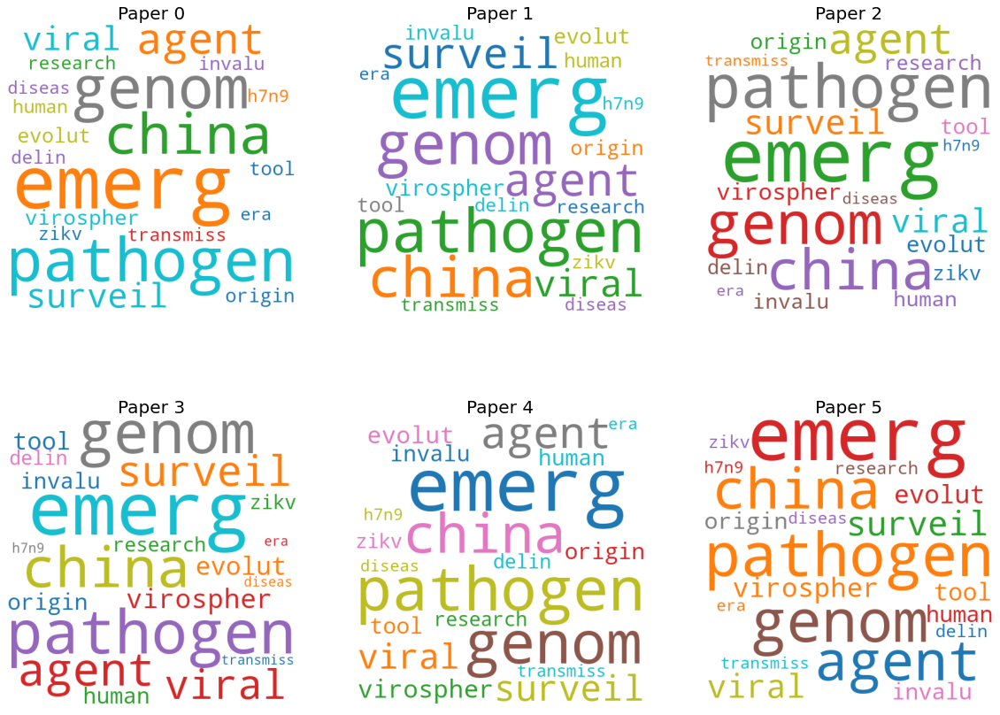

,title,doi,pmcid,pubmed_id,authors
0,Comparison between dairy cow disease incidence...,10.1016/j.prevetmed.2008.12.005,PMC7114122,1.9179e+07,"Mörk, M.; Lindberg, A.; Alenius, S.; Vågsholm,..."
1,The Impact of Farmers’ Strategic Behavior on t...,10.1371/journal.pone.0157450,PMC4907430,2.73004e+07,"Tago, Damian; Hammitt, James K.; Thomas, Alban..."
2,Managing Global Risks: Vietnamese Poultry Farm...,10.1007/978-981-287-527-3_15,PMC7120274,,"Figué, Muriel; Desvaux, Stéphanie"
3,Livestock diseases threatening smallholder far...,10.1016/j.ijid.2018.11.182,PMC7128429,,"Pauly, M.; Xaydalasouk, K.; Innoula, N.; Snoec..."
4,Limited awareness of animal influenza preventi...,10.1007/s11250-017-1335-3,PMC7089078,2.86249e+07,"Zhao, Xiang; Davey, Gareth"
5,Ethnoveterinary knowledge of farmers in biling...,10.1016/j.jep.2019.112184,,3.14658e+07,"Mertenat, Doréane; Cero, Maja Dal; Vogl, Chris..."


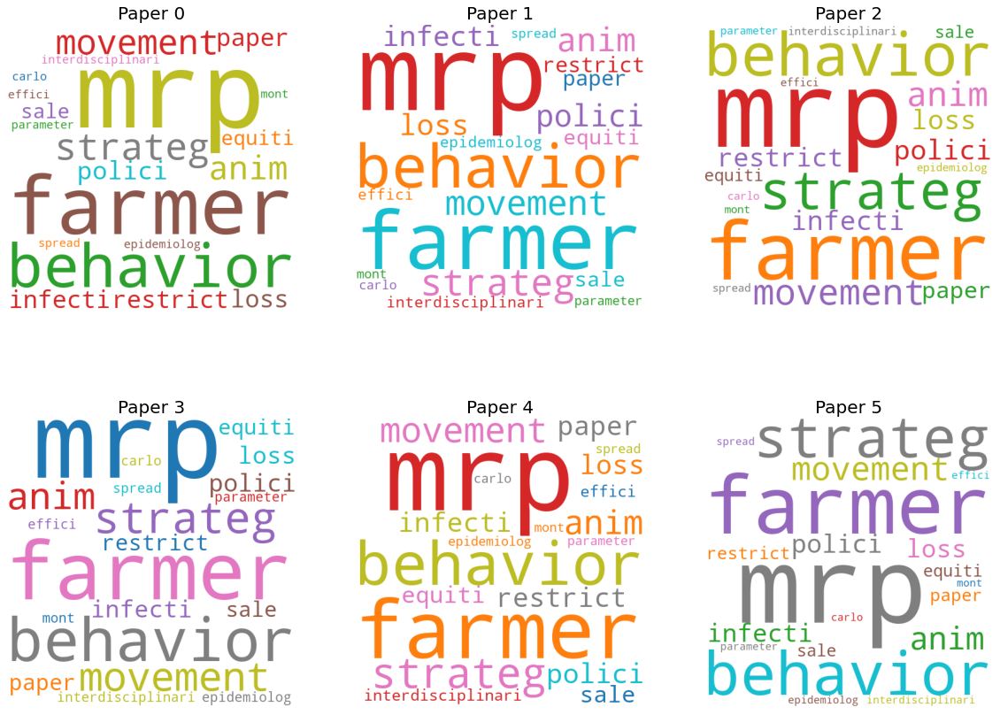

,title,doi,pmcid,pubmed_id,authors
0,Emerging Zoonoses in Domesticated Livestock of...,10.1016/b978-0-444-52512-3.00216-3,PMC7152182,,"Hassan, L."
1,Prospects for Emerging Infections in East and ...,10.3201/eid1906.121783,PMC3713834,2.3739e+07,"Horby, Peter W,; Pfeiffer, Dirk; Oshitani, Hit..."
2,First Middle East respiratory syndrome coronav...,10.1016/j.jmii.2015.02.466,PMC7129579,,"Liew, Z.H.; Look, M.L."
3,Cross-species transmission potential between w...,10.1038/s41598-017-07336-z,PMC5552697,2.87983e+07,"Miller, Ryan S.; Sweeney, Steven J.; Slootmake..."
4,Emerging infectious diseases in southeast Asia...,10.1016/s0140-6736(10)62004-1,,,"Coker, Richard J; Hunter, Benjamin M; Rudge, J..."
5,Surveillance and Response to Disease Emergence,10.1007/978-3-540-70962-6_19,PMC7121157,1.78481e+07,"Merianos, Angela"


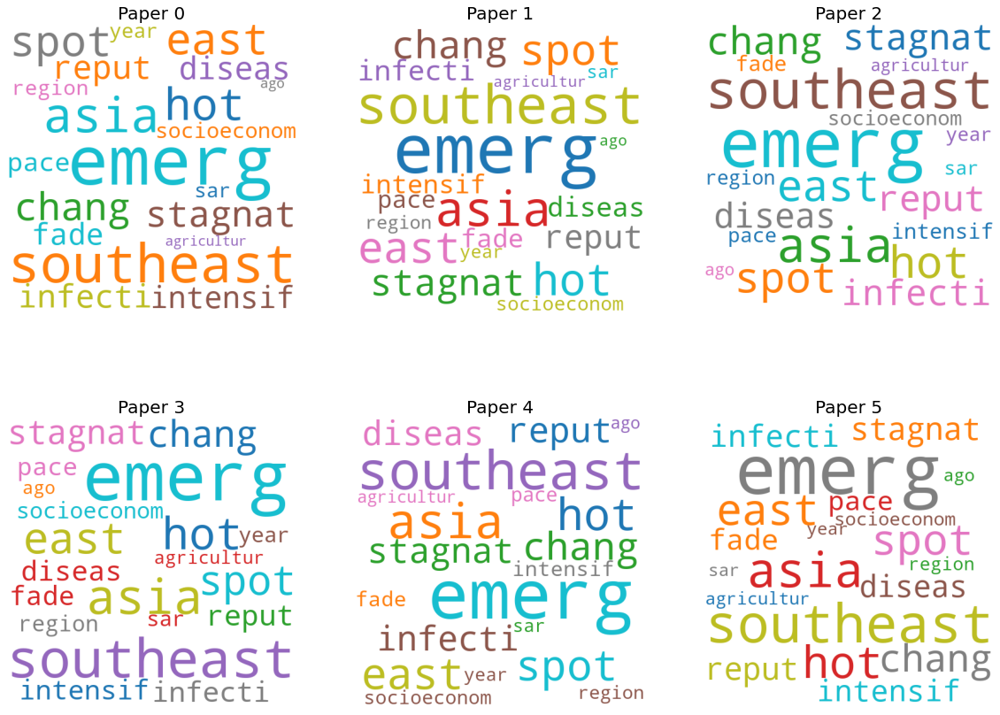

,title,doi,pmcid,pubmed_id,authors
0,Experimental evidence of a pathogen invasion t...,10.1098/rsos.171975,PMC5792953,2.94109e+07,"Dallas, Tad A.; Krkošek, Martin; Drake, John M."
1,Pathogen evolution within host individuals as ...,10.1007/bf01435985,PMC7087926,8.12527e+06,"Bell, Graham"
2,Fruits of Virus Discovery: New Pathogens and N...,10.1128/jvi.01194-14,PMC4300757,2.54109e+07,"Wang, David"
3,Modelling of Experimental Infections,10.1007/978-3-319-72317-4_4,PMC7123718,,"Bocharov, Gennady; Volpert, Vitaly; Ludewig, B..."
4,Association and Host Selectivity in Multi-Host...,10.1371/journal.pone.0000041,PMC1762347,1.71837e+07,"Malpica, José M.; Sacristán, Soledad; Fraile, ..."
5,Ecological factors driving the long-term evolu...,10.1098/rspb.2010.0519,PMC2981989,2.04447e+07,"Cobey, Sarah; Pascual, Mercedes; Dieckmann, Ulf"


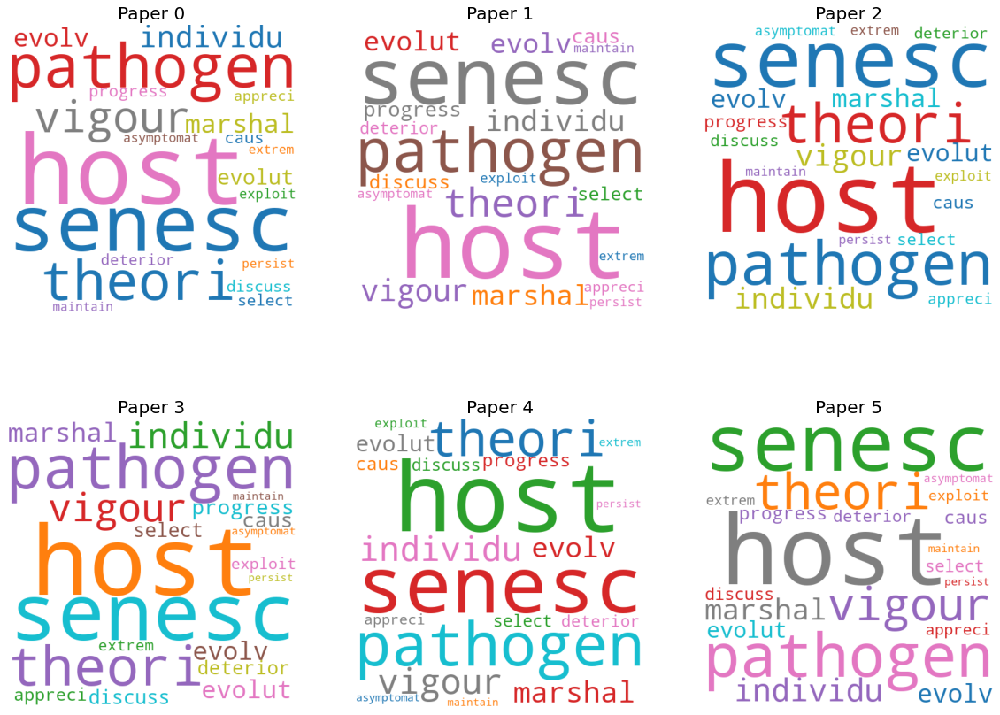

,title,doi,pmcid,pubmed_id,authors
0,Mapping Oil Spills from Dual-Polarized SAR Ima...,10.3390/s18072237,PMC6069476,2.99974e+07,"Kim, Daeseong; Jung, Hyung-Sup"
1,Are disease reservoirs special? Taxonomic and ...,10.1371/journal.pone.0180716,PMC5509157,2.87044e+07,"Plourde, Benjamin T.; Burgess, Tristan L.; Esk..."
2,Emerging and Transboundary Animal Viral Diseas...,10.1007/978-981-15-0402-0_1,PMC7123659,,"Yadav, Mahendra Pal; Singh, Raj Kumar; Malik, ..."
3,A Review of Hendra Virus and Nipah Virus Infec...,10.1007/978-94-017-9457-2_40,PMC7120151,,"Halpin, Kim; Rota, Paul"
4,"Spillover of Swine Coronaviruses, United States",10.3201/eid2407.172077,PMC6038755,2.99127e+07,"Bevins, Sarah N.; Lutman, Mark; Pedersen, Kerr..."
5,Cross host transmission in the emergence of ME...,10.1016/j.coviro.2016.01.004,PMC7102731,2.6827e+07,"Reusken, Chantal BEM; Raj, V Stalin; Koopmans,..."


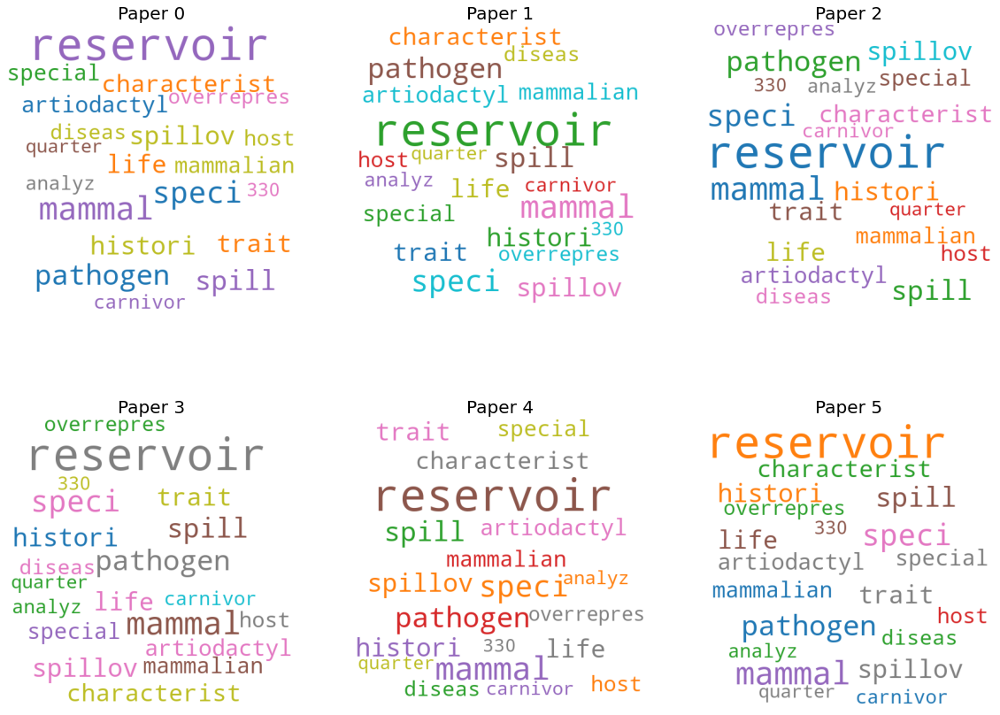

,title,doi,pmcid,pubmed_id,authors
0,Mapping Oil Spills from Dual-Polarized SAR Ima...,10.3390/s18072237,PMC6069476,2.99974e+07,"Kim, Daeseong; Jung, Hyung-Sup"
1,Impacts of Road Traffic Network and Socioecono...,10.3390/ijerph16071223,PMC6480969,3.09598e+07,"Xu, Bo; Tian, Huaiyu; Sabel, Clive Eric; Xu, Bing"
2,Transformation of the Developing World: Socioe...,10.3201/eid1011.040797_03,PMC3329049,1.60107e+07,"Carroll, Dennis; Gardner, Pierce; Kay, Bradfor..."
3,"Socioeconomic, geographic and climatic risk fa...",10.1016/j.prevetmed.2019.104816,PMC7126844,3.17392e+07,"Kelman, Mark; Barrs, Vanessa R.; Norris, Jacqu..."
4,Exposure to fear: Changes in travel behavior d...,10.1007/s12205-017-0821-5,PMC7149053,,"Kim, Chansung; Cheon, Seung Hoon; Choi, Keecho..."
5,Do socioeconomic conditions reflect a high exp...,,PMC1732873,1.53108e+07,"Filleul, L.; Harrabi, I.; Braga, A.; Martins, ..."


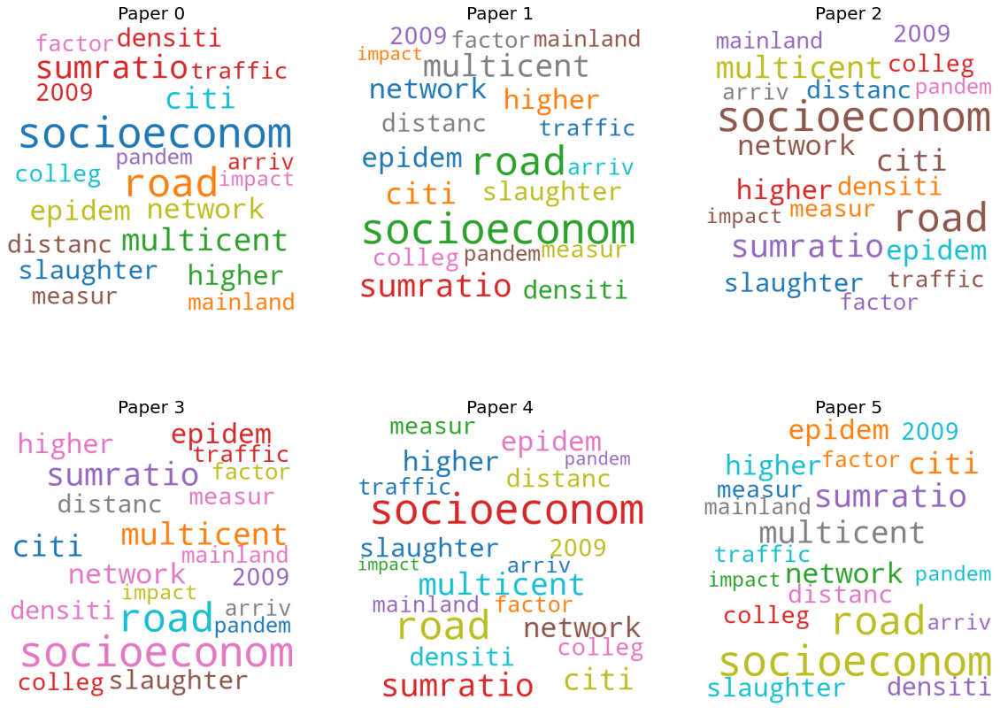

,title,doi,pmcid,pubmed_id,authors
0,Disaster risk reduction and sustainable develo...,10.1093/occmed/kqy058,PMC7107851,3.02129e+07,"Ahmad, Balsam; Murray, Virginia"
1,Opinion: Sustainable development must account ...,10.1073/pnas.2001655117,PMC7049118,3.20601e+07,"Di Marco, Moreno; Baker, Michelle L.; Daszak, ..."
2,Industrial accidents in China: risk reduction ...,10.1016/s0140-6736(15)00424-9,PMC7138044,2.6466e+07,"Chan, Emily Y Y; Wang, Zhe; Mark, Carman K M; ..."
3,The value of China-Africa health development i...,10.1016/s2414-6447(19)30062-4,PMC7148675,,"Tambo, Ernest; Tang, Shenglan; Ai, Lin; Zhou, ..."
4,"Air transport globalization, liberalization an...",10.1016/j.jtrangeo.2004.08.007,PMC7125701,,"Goetz, Andrew R.; Graham, Brian"
5,Non-invasive respiratory support for patients ...,10.1097/cm9.0000000000000761,,3.20972e+07,"Xia, Jin-Gen; Zhao, Jian-Ping; Cheng, Zhen-Shu..."


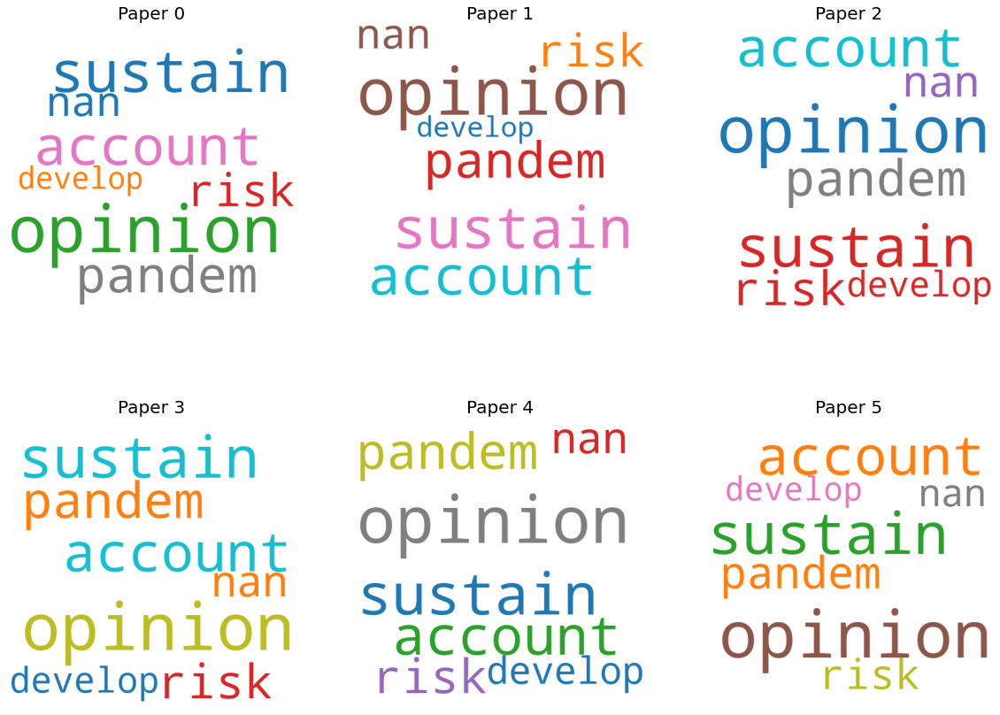

In [14]:
display_topics_results("What do we know about virus genetics, origin, and evolution?")

,title,doi,pmcid,pubmed_id,authors
0,A serological assay to detect SARS-CoV-2 seroc...,10.1101/2020.03.17.20037713,,,Fatima Amanat; Thi Nguyen; Veronika Chromikova...
1,An agent-based epidemic model REINA for COVID-...,10.1101/2020.04.09.20047498,,,Jouni T Tuomisto; Juha Yrjölä; Mikko Kolehmain...
2,Feasibility of Using Convalescent Plasma Immun...,10.3201/eid2209.151164,PMC4994343,2.75328e+07,"Arabi, Yaseen M.; Hajeer, Ali H.; Luke, Thomas..."
3,Presence of Middle East respiratory syndrome c...,10.1016/s1473-3099(15)70090-3,,2.58636e+07,"Müller, Marcel A; Meyer, Benjamin; Corman, Vic..."
4,Immunological assays for SARS-CoV-2: an analys...,10.1101/2020.04.10.20061150,,,John M Gonzalez; Jeremy W Shelton; Manuel Diaz...
5,Sensitive and Specific Detection of Low-Level ...,10.3201/eid2510.190051,PMC6759241,3.1424e+07,"Okba, Nisreen M.A.; Raj, V. Stalin; Widjaja, I..."


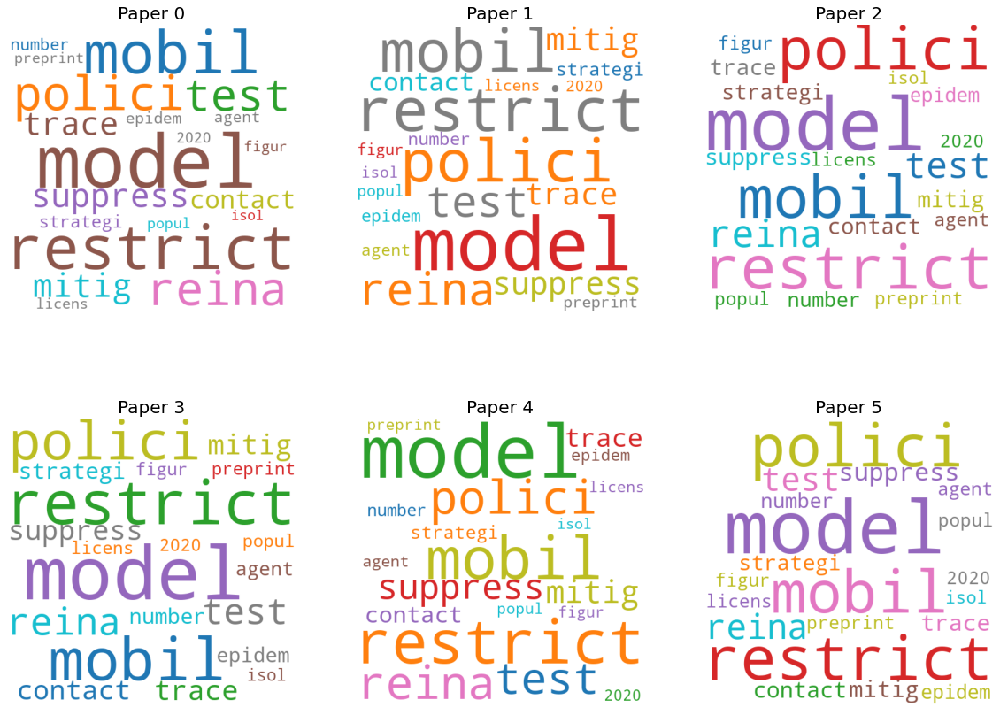

,title,doi,pmcid,pubmed_id,authors
0,Miniaturization for Point-of-Care Analysis: Pl...,,PMC4975254,2.76834e+07,"Schumacher, Soeren; Sartorius, Dorian; Ehrentr..."
1,Stable long‐term cultures of self‐renewing B c...,10.1111/imr.12395,PMC4755196,2.68641e+07,"Kwakkenbos, Mark J.; van Helden, Pauline M.; B..."
2,Point-of-Care Diagnostics,10.1007/978-3-319-13584-7_1,PMC7121962,,"Yetisen, Ali Kemal"
3,An effective DNA vaccine platform for Middle E...,10.21037/atm.2016.11.40,PMC5233508,2.81499e+07,"Cockrell, Adam S.; Baric, Ralph S."
4,The Potential Role of Social Media Platforms i...,10.2196/jmir.3891,PMC4642378,2.64711e+07,"Zowawi, Hosam Mamoon; Abedalthagafi, Malak; Ma..."
5,Open peer-review platform for COVID-19 preprints,10.1038/d41586-020-00613-4,,3.21277e+07,"Johansson, Michael A.; Saderi, Daniela"


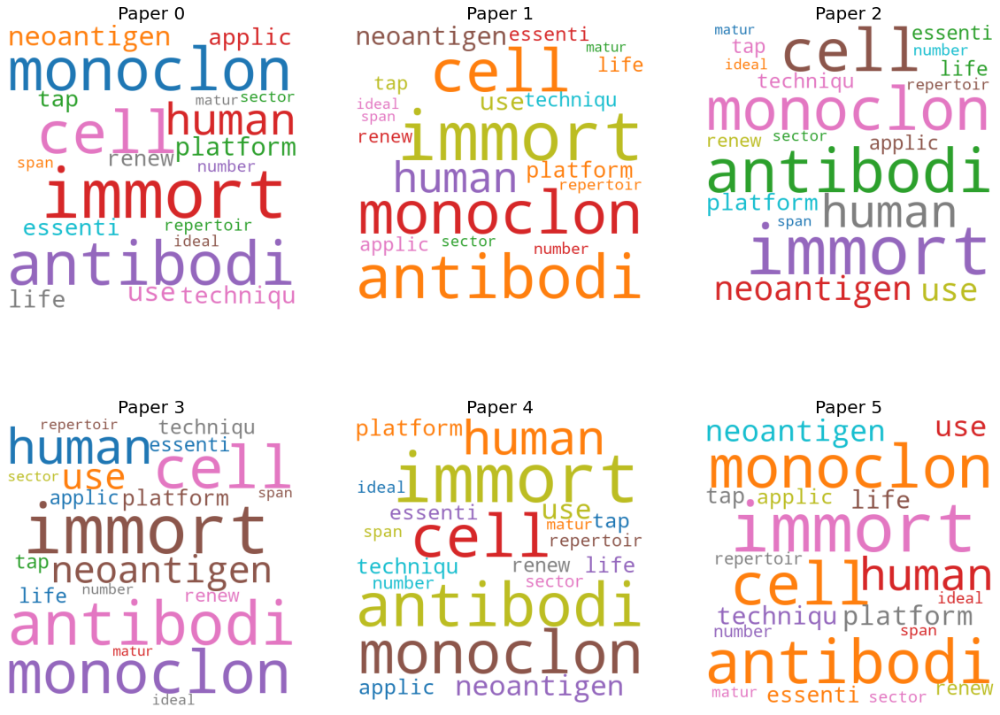

,title,doi,pmcid,pubmed_id,authors
0,Consortia’s critical role in developing medica...,10.2217/fvl-2015-0011,PMC4912138,2.73259e+07,"Everts, Maaike; Suto, Mark J; Painter, George ..."
1,Perspectives of Australian policy-makers on th...,10.1186/s12961-019-0440-3,PMC6449976,3.09477e+07,"Degeling, Chris; Johnson, Jane; Gilbert, Gwend..."
2,Chapter 4 Social Media and Health Crisis Commu...,10.1016/b978-0-12-809269-9.00004-9,PMC7149538,,"Denecke, K.; Atique, S."
3,Harnessing the privatisation of China's fragme...,10.1016/s0140-6736(14)61120-x,,2.51766e+07,"Yip, Winnie; Hsiao, William"
4,Recommendations for intensive care unit and ho...,10.1007/s00134-010-1759-y,PMC7079971,2.01351e+07,"Sprung, Charles L.; Zimmerman, Janice L.; Chri..."
5,Southeastern Center for Emerging Biologic Thre...,10.1089/bsp.2011.0040,PMC3316480,2.22836e+07,"Morris, J. Glenn; Greenspan, Allison; Howell, ..."


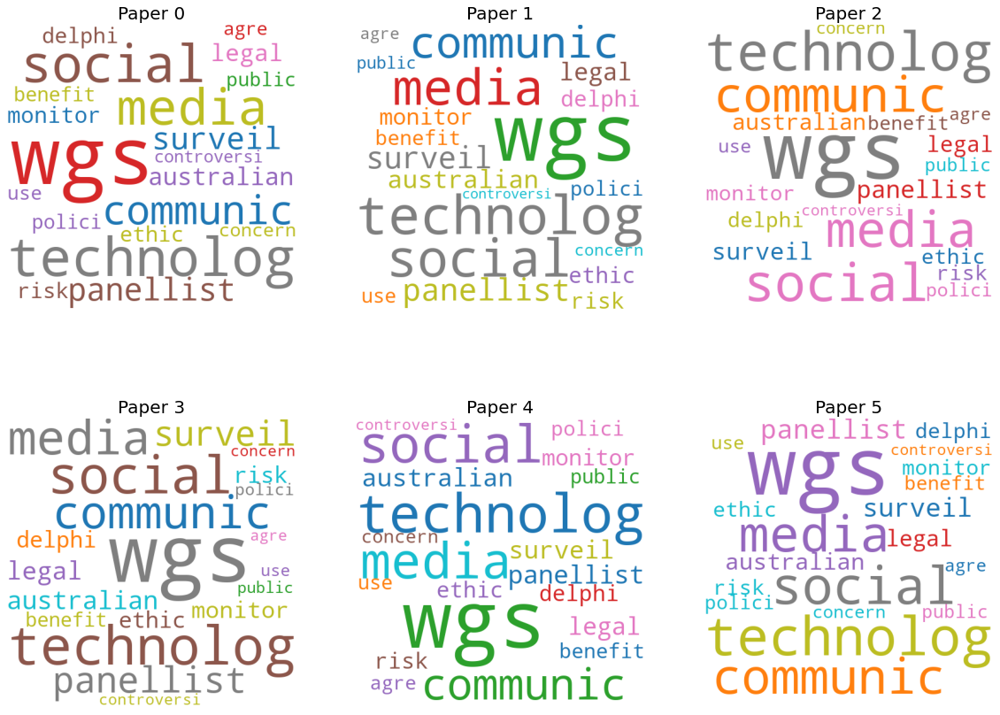

,title,doi,pmcid,pubmed_id,authors
0,Pandemic influenza control in Europe and the c...,10.1186/1471-2458-10-532,PMC2945945,2.08159e+07,"Martin, Robyn; Conseil, Alexandra; Longstaff, ..."
1,The role of law in pandemic influenza prepared...,10.1016/j.puhe.2009.01.002,PMC7119056,1.92613e+07,"Martin, R."
2,First Confirmed Cases of Middle East Respirato...,,PMC5779407,2.48274e+07,"Bialek, Stephanie R.; Allen, Donna; Alvarado-R..."
3,Initial Public Health Response and Interim Cli...,10.15585/mmwr.mm6905e1,PMC7004396,3.20276e+07,"Patel, Anita; Jernigan, Daniel B.; Abdirizak, ..."
4,Chapter 10 Organization of Public Health Systems,10.1016/b978-0-12-415766-8.00010-0,,,"Tulchinsky, Theodore H.; Varavikova, Elena A."
5,Southeastern Center for Emerging Biologic Thre...,10.1089/bsp.2011.0040,PMC3316480,2.22836e+07,"Morris, J. Glenn; Greenspan, Allison; Howell, ..."


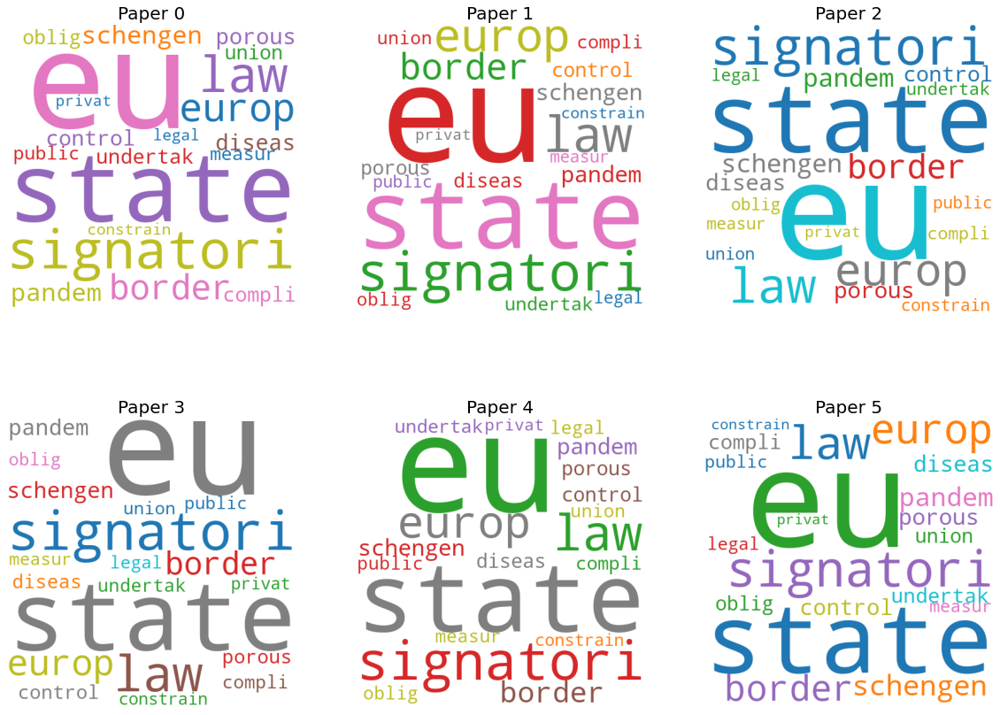

,title,doi,pmcid,pubmed_id,authors
0,"Rapid Tests for Influenza, Respiratory Syncyti...",10.1093/cid/cix461,PMC7108103,28520858.0,"Bruning, Andrea H L; Leeflang, Mariska M G; Vo..."
1,Detection of Influenza A and B Viruses and Res...,10.1128/jcm.00367-18,PMC6018333,29695519.0,"Azar, Marwan M.; Landry, Marie L."
2,The impact of rapid molecular diagnostic testi...,10.5694/mja2.50049,PMC6617970,30838671.0,"Wabe, Nasir; Li, Ling; Lindeman, Robert; Yimsu..."
3,Health service impact of testing for respirato...,10.1016/j.pathol.2018.08.012,PMC7111697,30389216.0,"Madigan, Victoria M.; Sinickas, Vincent G.; Gi..."
4,Recombinant Protein-Based Enzyme-Linked Immuno...,10.1128/cdli.11.2.287-291.2004,PMC371224,15013977.0,"Guan, Ming; Chen, Hsiao Ying; Yun Foo, Shen; T..."
5,Clinical utility of a near patient care microa...,,PMC4659065,26629177.0,"Chen, Xiu-Hong; Wang, Ji-Hua; Yao, Xiao-Hong"


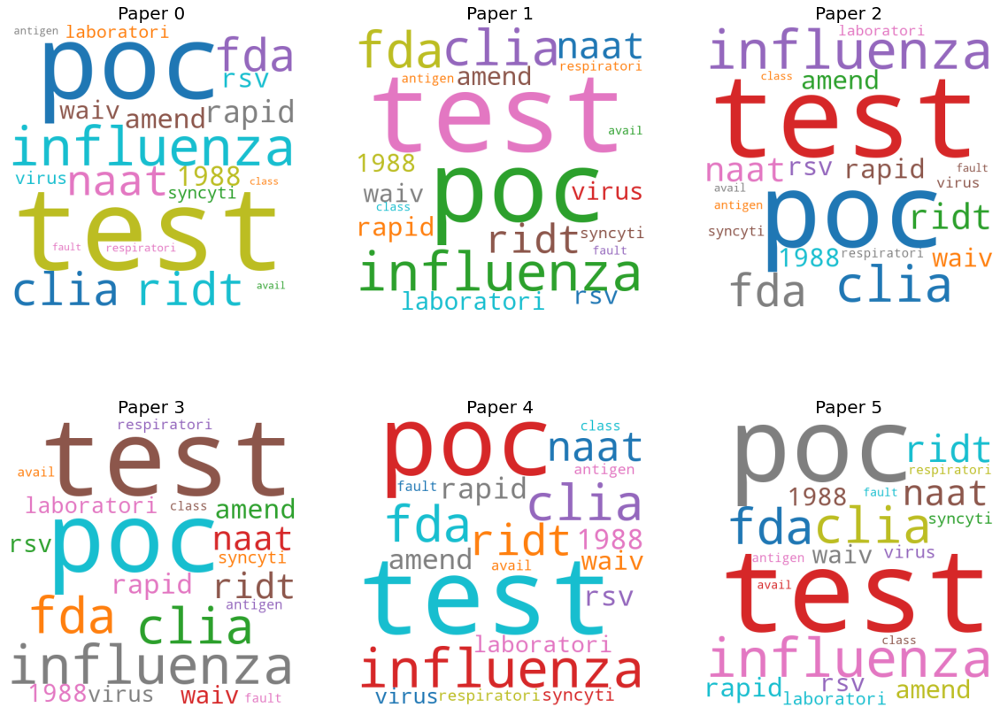

,title,doi,pmcid,pubmed_id,authors
0,Key data for outbreak evaluation: building on ...,10.1098/rstb.2016.0371,PMC5394647,2.83965e+07,"Cori, Anne; Donnelly, Christl A.; Dorigatti, I..."
1,Ad hoc laboratory-based surveillance of SARS-C...,10.1101/2020.03.30.20043513,,,Anna Maria Eis-Huebinger; Mario Hoenemann; Jue...
2,Emerging infectious disease laboratory and dia...,10.1080/21645515.2019.1634992,PMC6816404,3.12684e+07,"Roberts, Christine C."
3,The Seattle Flu Study: a multi-arm community-b...,10.1101/2020.03.02.20029595,,,Helen Y. Chu; Michael Boeckh; Janet A. Englund...
4,Respiratory Infections in the U.S. Military: R...,10.1128/cmr.00039-14,PMC4475643,2.60856e+07,"Sanchez, Jose L.; Cooper, Michael J.; Myers, C..."
5,The psychiatric impact of the novel coronaviru...,10.1016/j.psychres.2020.112902,PMC7133679,3.21462e+07,"Carvalho, Poliana Moreira de Medeiros; Moreira..."


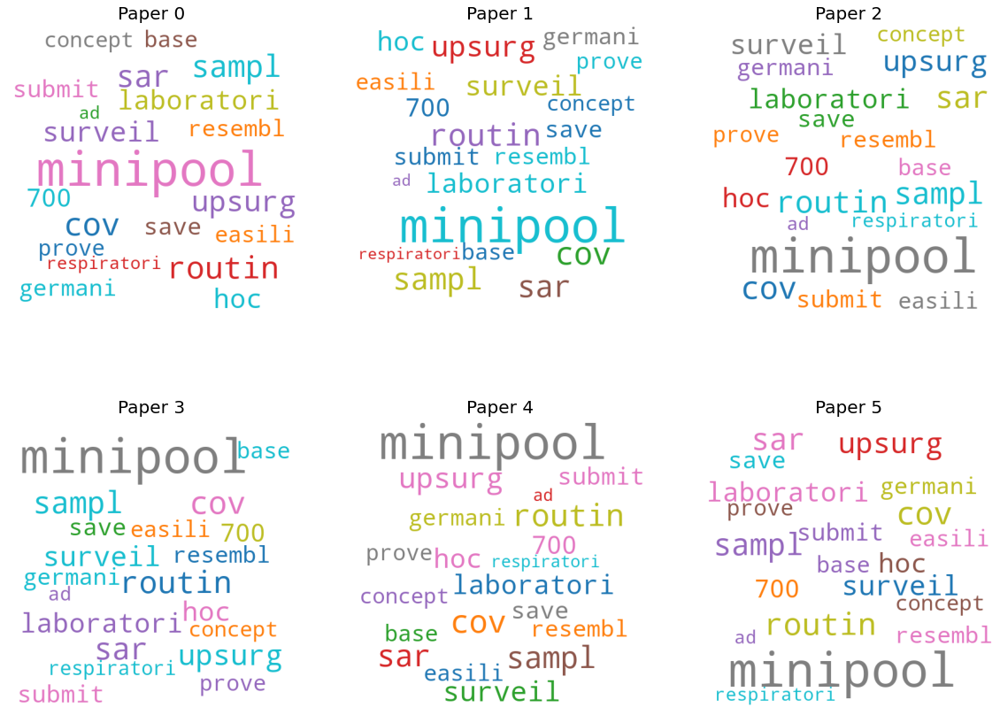

,title,doi,pmcid,pubmed_id,authors
0,Advances in Molecular Diagnostic Approaches fo...,10.1007/978-3-030-03071-1_13,PMC7123646,,"Rastogi, Meghana; Singh, Sunit K."
1,Development and Preliminary Evaluation of a Ra...,10.1128/jcm.01487-09,PMC2863916,2.02202e+07,"Pérez-Ruiz, Mercedes; Navarro-Marí, José-María..."
2,Research and Development of New Vaccines Again...,,PMC1448562,1.55142e+07,"Kieny, Marie Paule; Excler, Jean-Louis; Girard..."
3,"A Simple, Inexpensive Device for Nucleic Acid ...",10.1371/journal.pone.0019738,PMC3090398,2.15731e+07,"LaBarre, Paul; Hawkins, Kenneth R.; Gerlach, J..."
4,Point-of-Care Diagnostics,10.1007/978-3-319-13584-7_1,PMC7121962,,"Yetisen, Ali Kemal"
5,Infectious disease and economics: The case for...,10.1016/j.onehlt.2018.100080,PMC6330263,3.06715e+07,"Smith, Kristine M.; Machalaba, Catherine C.; S..."


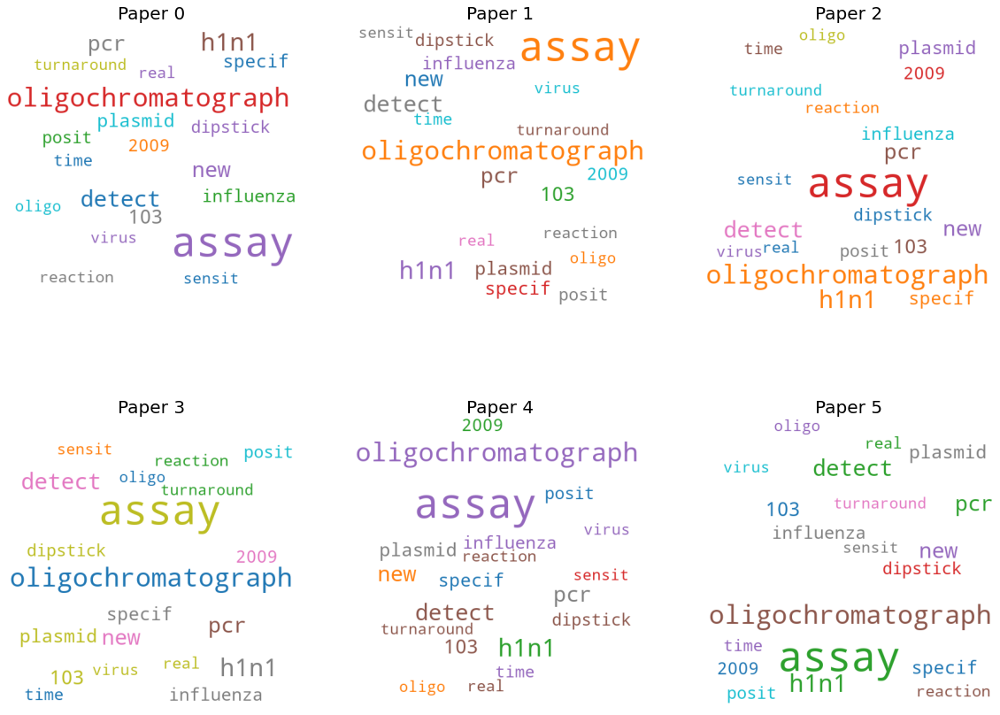

,title,doi,pmcid,pubmed_id,authors
0,Genetic drift of human coronavirus OC43 spike ...,10.1038/srep11451,PMC4476415,2.6099e+07,"Ren, Lili; Zhang, Yue; Li, Jianguo; Xiao, Yan;..."
1,Evolution and public health,10.1073/pnas.0906198106,PMC2868289,1.99663e+07,"Omenn, Gilbert S."
2,Chapter 6 Drift and Conservatism in RNA Virus ...,10.1016/b978-012220360-2/50007-6,,,"Sola, Monica; Wain-Hobson, Simon"
3,Genomes of the Mouse Collaborative Cross,10.1534/genetics.116.198838,PMC5499171,2.85925e+07,"Srivastava, Anuj; Morgan, Andrew P.; Najarian,..."
4,Development of a molecular-beacon-based multi-...,10.1007/s00705-010-0906-7,PMC7087183,2.12217e+07,"Hadjinicolaou, Andreas V.; Farcas, Gabriella A..."
5,Genetic Diversity and Evolution of Viral Popul...,10.1016/b978-0-12-809633-8.20958-8,,,"Sanjuán, Rafael; Domingo-Calap, Pilar"


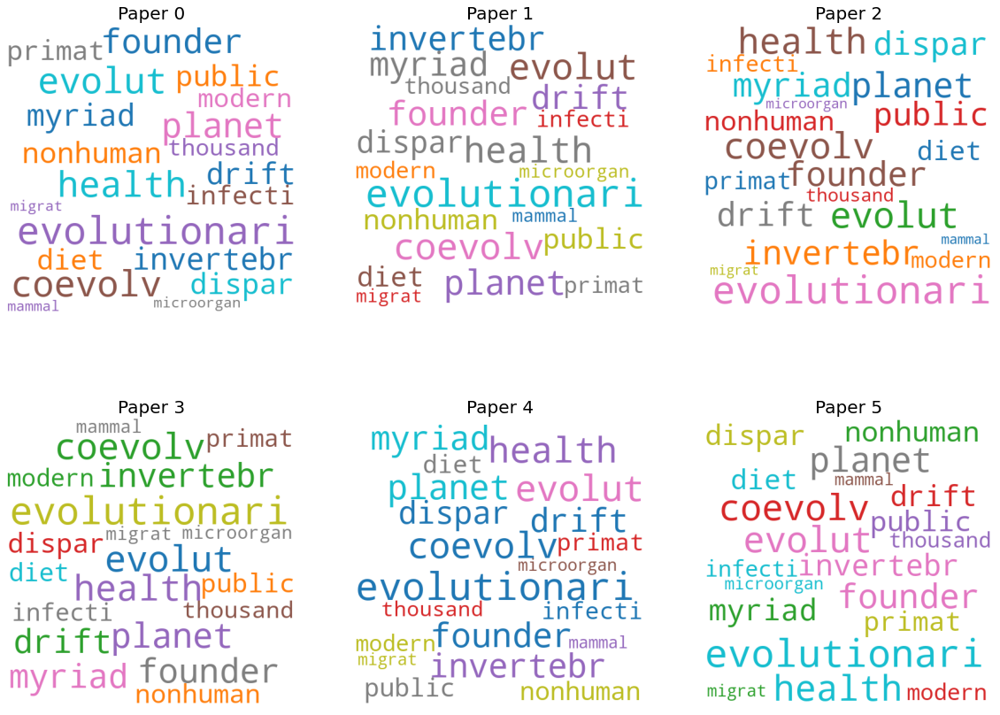

,title,doi,pmcid,pubmed_id,authors
0,Licking latency with licorice,10.1172/jci200524507,PMC1052015,1.57651e+07,"Cohen, Jeffrey I."
1,Chapter 13 Recent Advances and Future Needs in...,10.1016/s0168-7069(07)17013-0,PMC7114941,,"Wong, Mark; Xagoraraki, Irene; Rose, Joan B."
2,Overview of Trends in the Application of Metag...,10.3390/v10080429,PMC6115975,3.01109e+07,"Osunmakinde, Cecilia Oluseyi; Selvarajan, Ramg..."
3,Alternative promoters drive human cytomegalovi...,10.1073/pnas.1900783116,PMC6717278,3.14097e+07,"Collins-McMillen, Donna; Rak, Mike; Buehler, J..."
4,Critical Dynamics in Host–Pathogen Systems,10.1007/82_2012_260,PMC7121065,2.29763e+07,"Benecke, Arndt G."
5,The abundant latency-associated transcripts of...,,PMC191416,9.06065e+06,"Goldenberg, D; Mador, N; Ball, M J; Panet, A; ..."


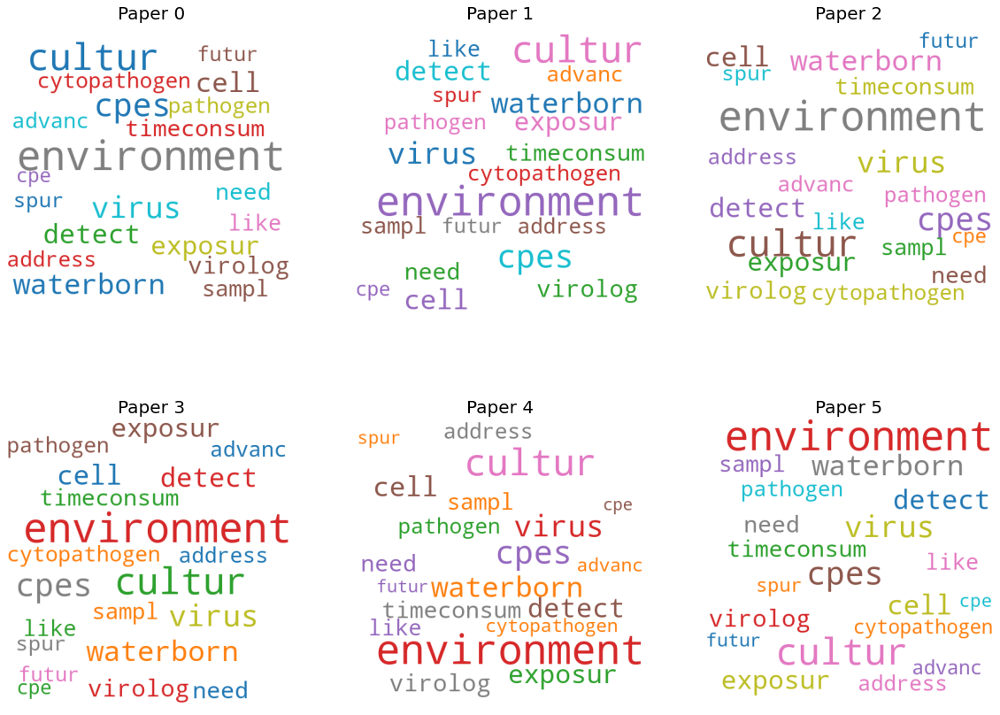

,title,doi,pmcid,pubmed_id,authors
0,Animal models for highly pathogenic emerging v...,10.1016/j.coviro.2013.01.001,PMC3644300,2.34032e+07,"Safronetz, David; Geisbert, Thomas W; Feldmann..."
1,Chapter 1 Introduction,10.1016/b978-0-444-53794-2.00001-x,,,"Sadana, Ajit; Sadana, Neeti"
2,Immunopathogenesis of 2009 pandemic influenza,10.1016/s0213-005x(12)70100-3,PMC7130369,2.31168e+07,"Almansa, Raquel; Bermejo-Martín, Jesús F.; de ..."
3,Respiratory Viral Infections in Patients With ...,10.3389/fmicb.2018.03097,PMC6299032,3.06192e+07,"Hijano, Diego R.; Maron, Gabriela; Hayden, Ran..."
4,Severe Acute Respiratory Syndrome and Coronavirus,10.1016/j.idc.2010.04.009,PMC7127710,2.06748e+07,"Hui, David S.C.; Chan, Paul K.S."
5,Mathematical Analysis of Viral Replication Dyn...,10.3389/fmicb.2018.01546,PMC6050366,3.00505e+07,"Zitzmann, Carolin; Kaderali, Lars"


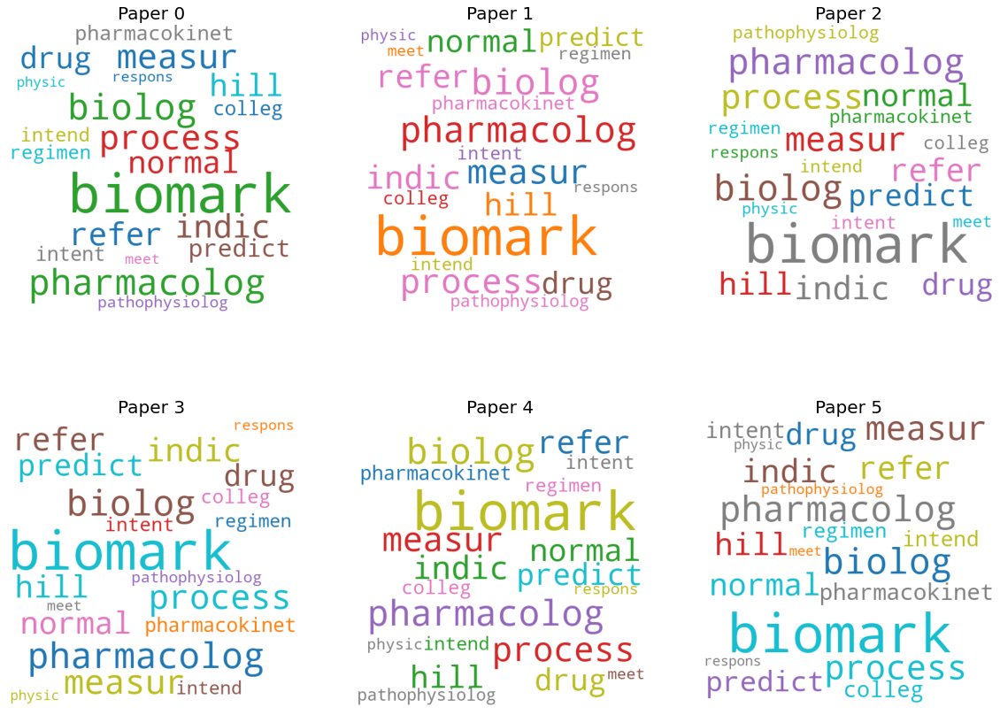

,title,doi,pmcid,pubmed_id,authors
0,Entry screening for severe acute respiratory s...,10.1136/bmj.38573.696100.3a,PMC1289362,1.61769e+07,"Pitman, R J; Cooper, B S; Trotter, C L; Gay, N..."
1,A Comparative High-Throughput Screening Protoc...,10.1177/1087057113494405,PMC4679145,2.38216e+07,"Wang, Juan; Cheng, Han; Ratia, Kiira; Varhegyi..."
2,Section 5 Laboratory Diagnosis and Test Protocols,10.1016/b978-1-4377-0798-4.00005-0,,,"Ford, Richard B.; Mazzaferro, Elisa M."
3,Section 5 Laboratory Diagnosis and Test Protocols,10.1016/b0-72-160138-3/50006-0,,,"Ford, Richard B.; Mazzaferro, Elisa M."
4,Adherence to Universal Travel Screening in the...,10.1016/j.jemermed.2018.09.038,PMC7126944,3.03429e+07,"Burkholder, Taylor W.; Dziadkowiec, Oliwier; B..."
5,Uncertain Benefit: The Public Policy of Approv...,,PMC1448369,1.52493e+07,"Quigley, Rosemary B"


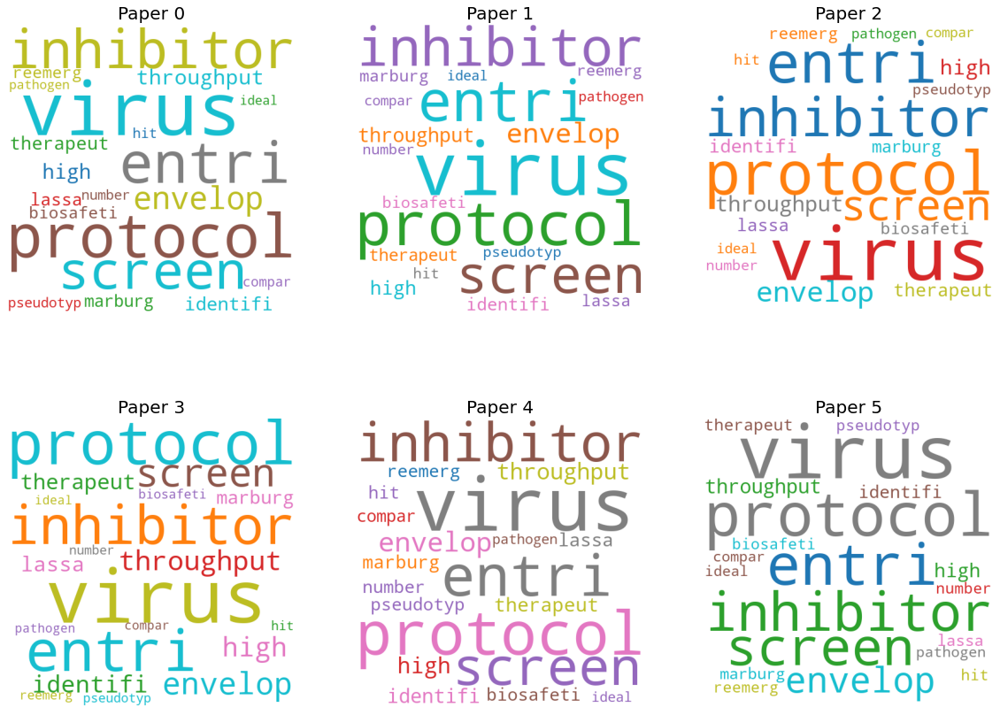

,title,doi,pmcid,pubmed_id,authors
0,"Vaccine supply, demand, and policy: A primer",10.1331/japha.2009.09007,,1.95898e+07,"Muzumdar, Jagannath M.; Cline, Richard R."
1,An agent-based epidemic model REINA for COVID-...,10.1101/2020.04.09.20047498,,,Jouni T Tuomisto; Juha Yrjölä; Mikko Kolehmain...
2,Predictive and Reactive Distribution of Vaccin...,10.1155/2011/579597,PMC3447295,2.30747e+07,"Uribe-Sánchez, Andrés; Savachkin, Alex"
3,Economic optimization of a global strategy to ...,10.1073/pnas.1412661112,PMC4284561,2.55125e+07,"Pike, Jamison; Bogich, Tiffany; Elwood, Sarah;..."
4,Closure of schools during an influenza pandemic,10.1016/s1473-3099(09)70176-8,PMC7106429,1.96282e+07,"Cauchemez, Simon; Ferguson, Neil M; Wachtel, C..."
5,Dynamic Modeling to Identify Mitigation Strate...,10.1101/2020.03.27.20045237,,,Patrick Jenny; David F Jenny; Hossein Gorji; M...


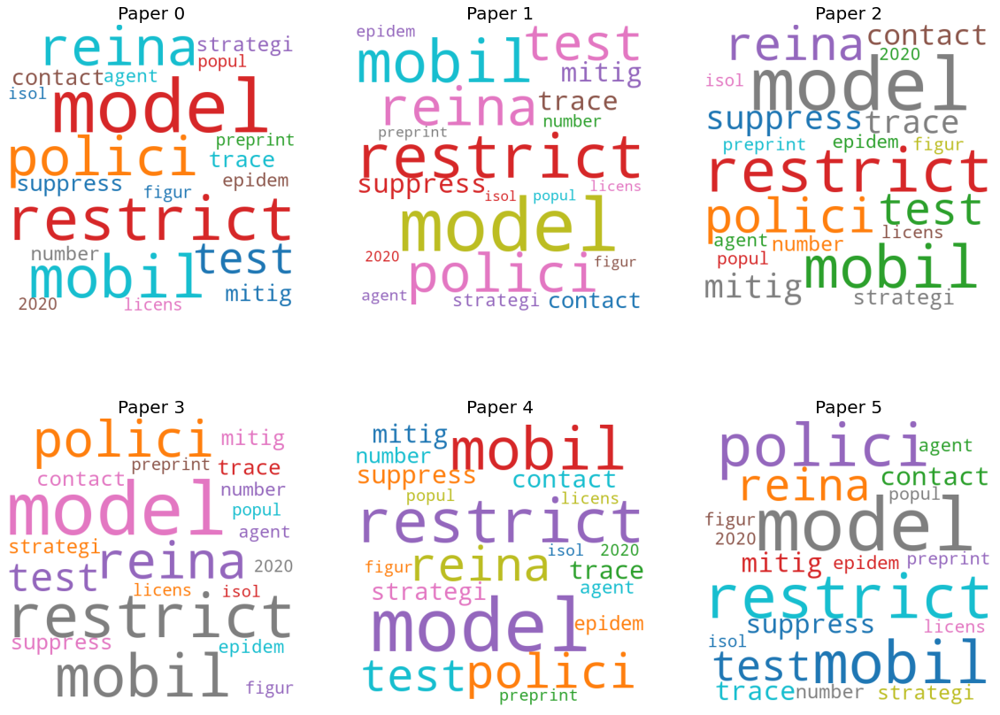

,title,doi,pmcid,pubmed_id,authors
0,Building a Multi-Institutional and Interdiscip...,10.3389/fpubh.2018.00167,PMC6008525,2.99515e+07,"Olea-Popelka, Francisco; Fujiwara, Paula I."
1,An updated roadmap for MERS-CoV research and p...,10.1136/bmjgh-2018-001105,PMC6361340,3.08153e+07,"Kelly-Cirino, Cassandra; Mazzola, Laura T; Chu..."
2,Roadmap to developing a recombinant coronaviru...,10.1586/erv.12.126,PMC3586247,2.32524e+07,"Jiang, Shibo; Bottazzi, Maria Elena; Du, Lanyi..."
3,Roadmap of Agricultural Production and Food Sa...,10.1007/978-3-642-19128-2_7,PMC7124058,,"Zhao, Qiguo; Huang, Jikun"
4,A roadmap for MERS-CoV research and product de...,10.1038/nm.4131,PMC7096003,2.73879e+07,"Modjarrad, Kayvon; Moorthy, Vasee S; Ben Embar..."
5,Diagnostic tools for tackling febrile illness ...,10.1016/j.mee.2018.10.001,PMC7114275,,"Mitsakakis, Konstantinos; D'Acremont, Valérie;..."


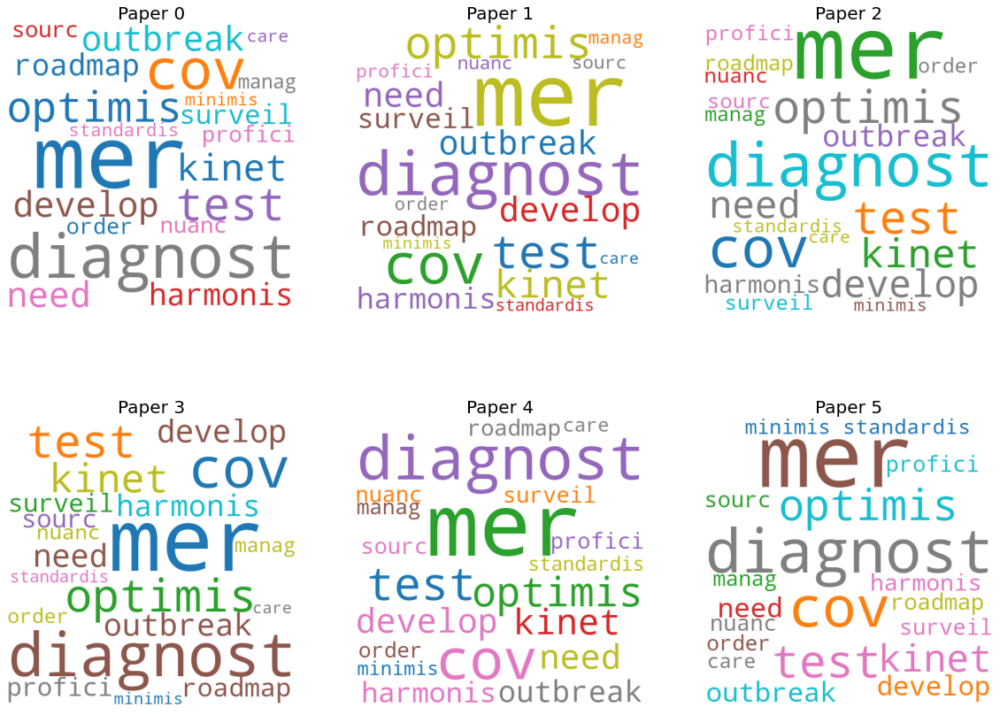

,title,doi,pmcid,pubmed_id,authors
0,Global coalition to accelerate COVID-19 clinic...,10.1016/s0140-6736(20)30798-4,,,
1,Vaccines for epidemic infections and the role ...,10.1080/21645515.2017.1306615,PMC5718831,2.83758e+07,"Plotkin, Stanley A."
2,Outbreak response as an essential component of...,10.1016/s1473-3099(19)30305-6,PMC7106413,3.1257e+07,"Hatchett, Richard; Lurie, Nicole"
3,Funding vaccines for emerging infectious diseases,10.1080/21645515.2017.1412024,PMC6067896,2.9194e+07,"Wong, Gary; Qiu, Xiangguo"
4,Developing vaccines against epidemic-prone eme...,10.1007/s00103-019-03061-2,PMC6925075,3.17766e+07,"Bernasconi, Valentina; Kristiansen, Paul A.; W..."
5,Vaccines: Shaping global health,10.1016/j.vaccine.2017.02.017,PMC7127343,2.82375e+07,"Pagliusi, Sonia; Ting, Ching-Chia; Lobos, Fern..."


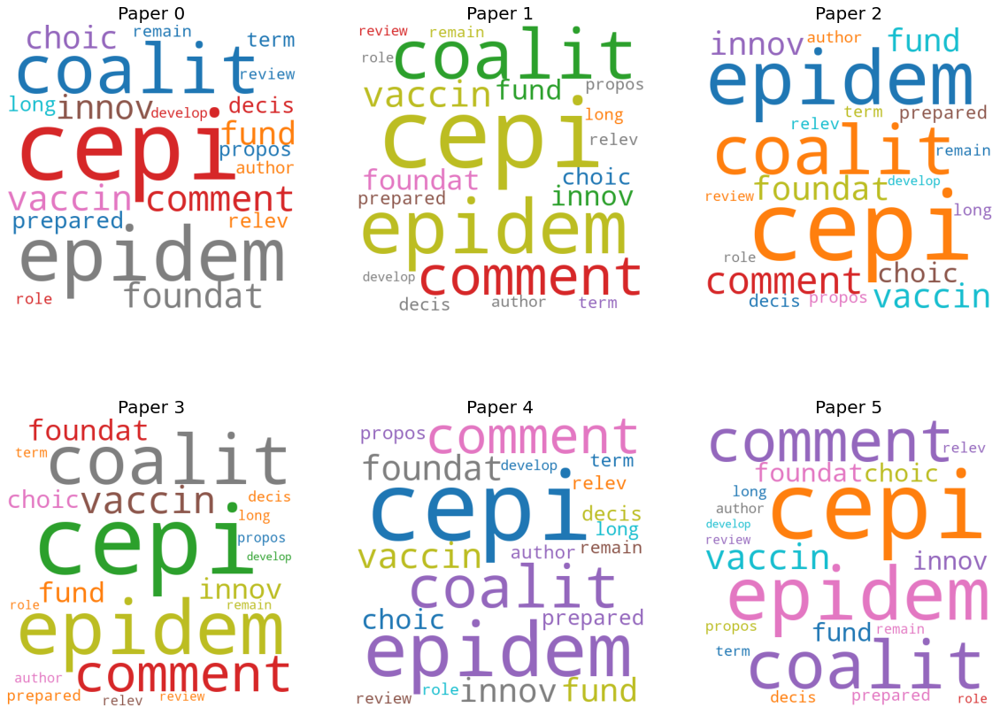

,title,doi,pmcid,pubmed_id,authors
0,Holistic care for patients with severe coronav...,10.1016/j.ijnss.2020.03.010,,,"Wang, Hui; Zeng, Tieying; Wu, Xinjuan; Sun, Hong"
1,SARS-CoV-2 detection with CRISPR diagnostics,10.1101/2020.04.10.023358,,,Lu Guo; Xuehan Sun; Xinge Wang; Chen Liang; Ha...
2,新型冠状病毒SARS-CoV-2的实验室检测技术,10.12122/j.issn.1673-4254.2020.02.04,PMC7086127,,
3,Cutting-Edge Infectious Disease Diagnostics wi...,10.1016/j.chom.2018.05.016,PMC7105017,2.99024e+07,"Chiu, Charles"
4,CRISPR in livestock: From editing to printing,10.1016/j.theriogenology.2020.01.063,,,"Menchaca, A.; dos Santos-Neto, P.C.; Mulet, A...."
5,Emerging technologies for the detection of vir...,10.2217/fvl-2018-0145,PMC6956246,3.19337e+07,"Burbelo, Peter D.; Iadarola, Michael J.; Chatu..."


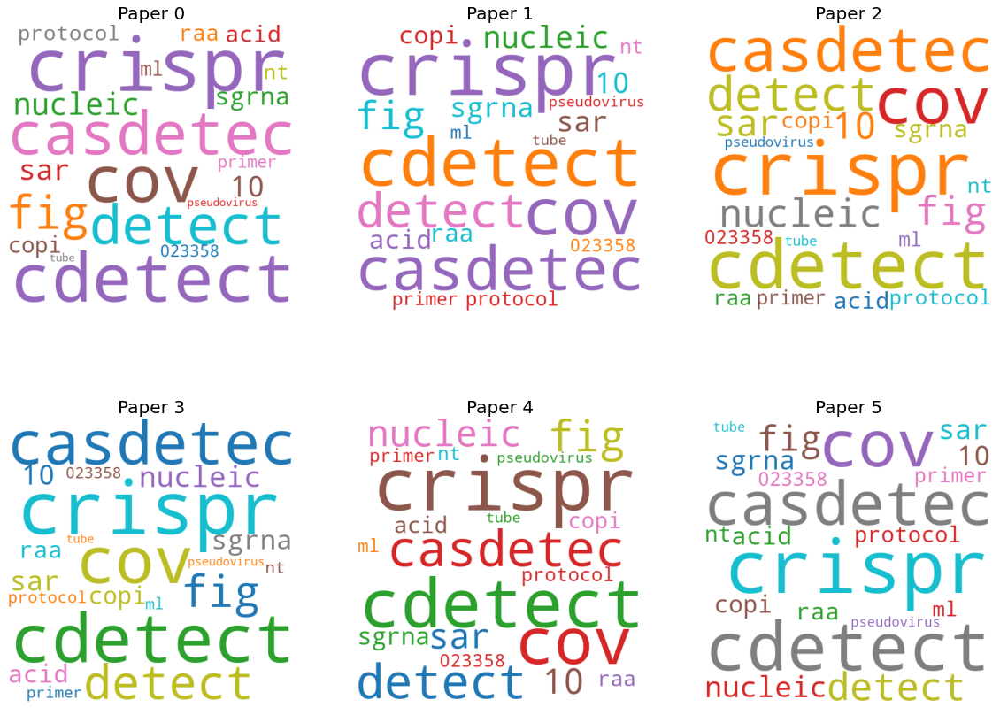

,title,doi,pmcid,pubmed_id,authors
0,Functional genomics in virology and antiviral ...,10.1016/s0167-7799(03)00207-5,PMC7127688,1.45122e+07,"DeFilippis, Victor; Raggo, Camilo; Moses, Ashl..."
1,Attenuation of Viruses by Large-Scale Recoding...,10.1007/s40588-018-0080-3,PMC7100164,,"Osterrieder, Nikolaus; Kunec, Dusan"
2,Is scaling-up COVID-19 testing cost-saving?,10.1101/2020.03.22.20041137,,,Bernardo Sousa-Pinto; Joao Almeida Fonseca; Al...
3,Multi-scale computational modelling in biology...,10.1016/j.pbiomolbio.2007.07.019,PMC7112301,1.78885e+07,"Southern, James; Pitt-Francis, Joe; Whiteley, ..."
4,Large-Scale Preparation of UV-Inactivated SARS...,10.1007/978-1-59745-181-9_11,PMC7122600,1.90579e+07,"Tsunetsugu-Yokota, Yasuko"
5,The evolving field of biodefence: therapeutic ...,10.1038/nrd1694,PMC7096857,1.58032e+07,"Burnett, James C.; Henchal, Erik A.; Schmaljoh..."


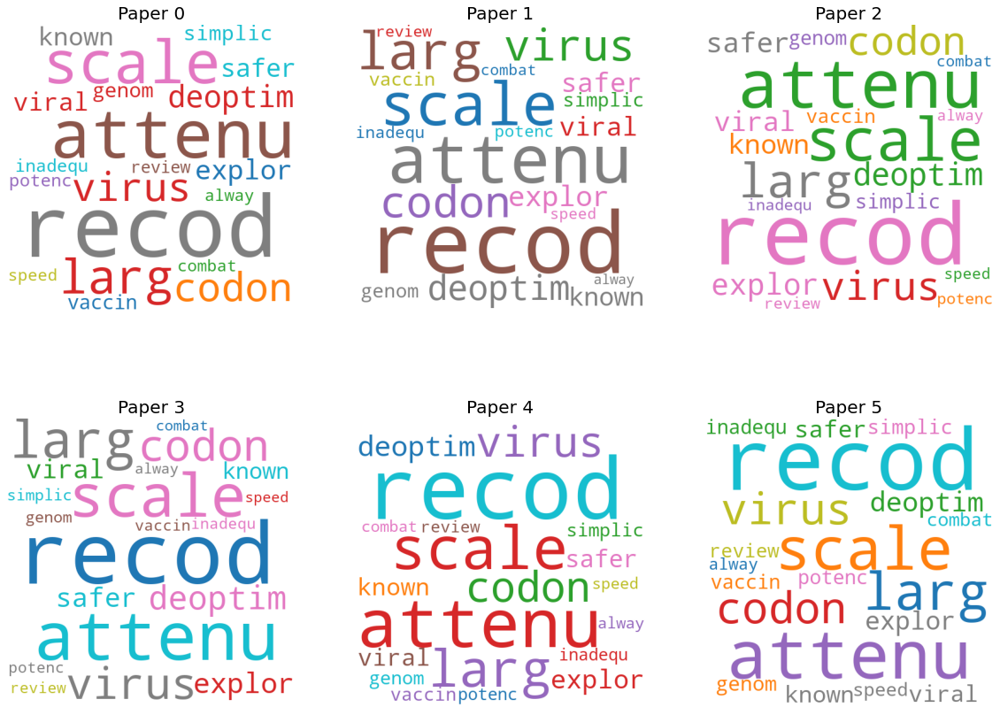

,title,doi,pmcid,pubmed_id,authors
0,The Study of Viral RNA Diversity in Bird Sampl...,10.1155/2018/3248285,PMC6109506,3.0159e+07,"Ayginin, Andrey A.; Pimkina, Ekaterina V.; Mat..."
1,Rapid metagenomic characterization of a case o...,10.1101/2020.03.02.968818,,,Jessica E. Manning; Jennifer A. Bohl; Sreyngim...
2,"18 Omics, Bioinformatics, and Infectious Disea...",10.1016/b978-0-12-384890-1.00018-2,PMC7149799,,"Paszkiewicz, Konrad H.; Giezen, Mark van der"
3,A systematic bioinformatics approach for selec...,10.1016/j.cellimm.2007.02.005,PMC2041846,1.74342e+07,"Khan, Asif M.; Miotto, Olivo; Heiny, A.T.; Sal..."
4,A Sequence Homology and Bioinformatic Approach...,10.1016/j.chom.2020.03.002,PMC7142693,3.21839e+07,"Grifoni, Alba; Sidney, John; Zhang, Yun; Scheu..."
5,A bioinformatic filter for improved base-call ...,10.1093/nar/gkm918,PMC2175352,1.80066e+07,"Pandya, Gagan A.; Holmes, Michael H.; Sunkara,..."


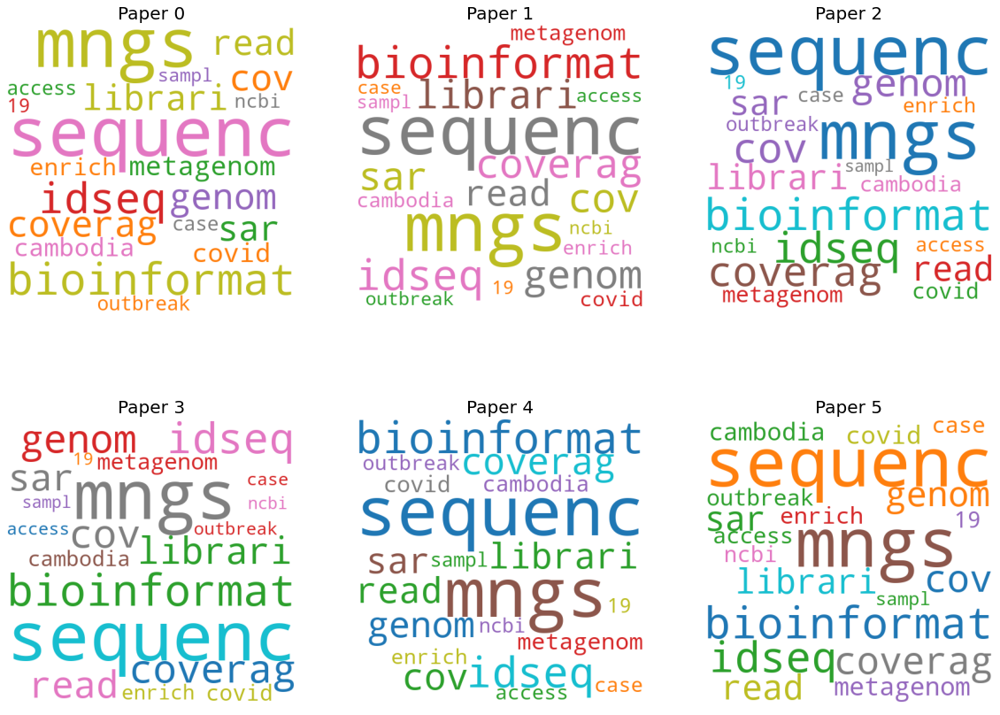

,title,doi,pmcid,pubmed_id,authors
0,High Throughput Sequencing for Detection of Fo...,10.3389/fmicb.2017.02029,PMC5655695,2.91046e+07,"Sekse, Camilla; Holst-Jensen, Arne; Dobrindt, ..."
1,Bioaffinity detection of pathogens on surfaces,10.1016/j.jiec.2010.01.061,PMC7129010,,"Wark, Alastair W.; Lee, Jaeyoung; Kim, Suhee; ..."
2,Next-Generation Sequencing in Veterinary Medic...,10.1007/978-1-4939-2004-4_30,PMC7123048,2.53991e+07,"Van Borm, Steven; Belák, Sándor; Freimanis, Gr..."
3,Chapter 8 Forensic public health epidemiologic...,10.1016/b978-0-12-815379-6.00008-8,PMC7153336,,"Khan, Ali S.; Amara, Philip S.; Morse, Stephen A."
4,Natural selection and infectious disease in hu...,10.1038/nrg3734,PMC4912034,2.47768e+07,"Karlsson, Elinor K.; Kwiatkowski, Dominic P.; ..."
5,Confronting the threat of bioterrorism: realit...,10.1016/s1473-3099(18)30298-6,PMC7106434,3.0341e+07,"Green, Manfred S; LeDuc, James; Cohen, Daniel;..."


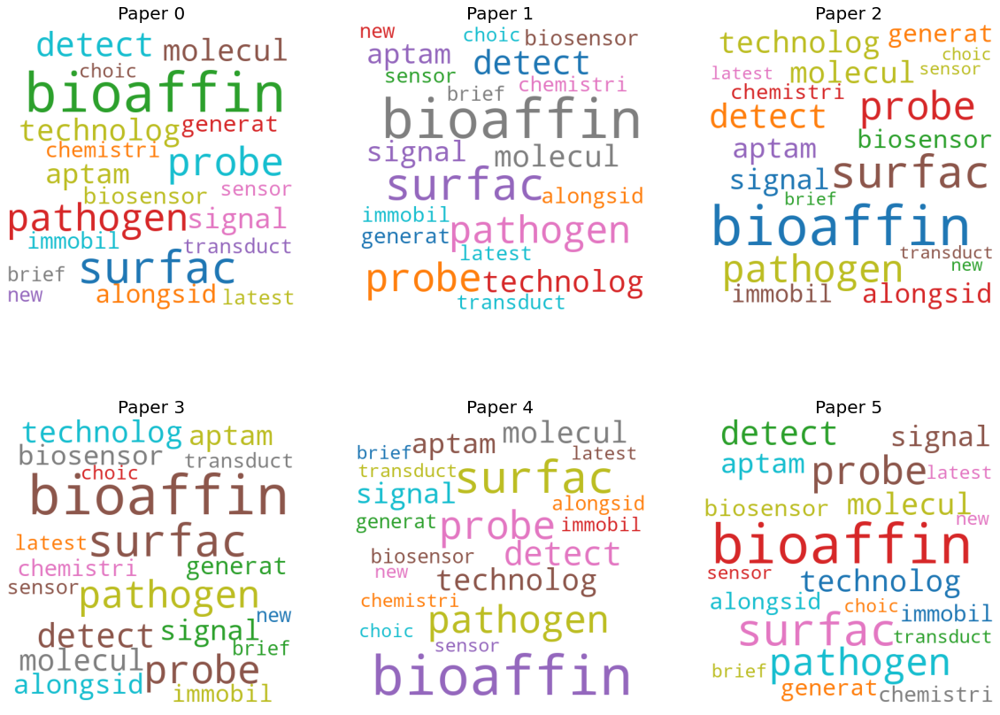

,title,doi,pmcid,pubmed_id,authors
0,Interdisciplinary approaches to understanding ...,10.1073/pnas.1201243109,PMC3586606,2.29361e+07,"Daszak, Peter; Zambrana-Torrelio, Carlos; Bogi..."
1,Host and viral traits predict zoonotic spillov...,10.1038/nature22975,PMC5570460,2.86366e+07,"Olival, Kevin J.; Hosseini, Parviez R.; Zambra..."
2,Epidemiological Interaction at the Wildlife/Li...,10.1007/978-94-007-2114-2_14,PMC7121693,,"Caron, Alexandre; Morand, Serge; de Garine-Wic..."
3,Community Epidemiology Framework for Classifyi...,10.3201/eid1112.050306,PMC3367628,1.64855e+07,"Fenton, Andy; Pedersen, Amy B."
4,Responses of migratory species and their patho...,10.1098/rstb.2017.0094,PMC5883000,2.95311e+07,"Satterfield, Dara A.; Marra, Peter P.; Sillett..."
5,A framework for the study of zoonotic disease ...,10.1098/rstb.2012.0228,PMC3427567,2.29661e+07,"Wood, James L. N.; Leach, Melissa; Waldman, Li..."


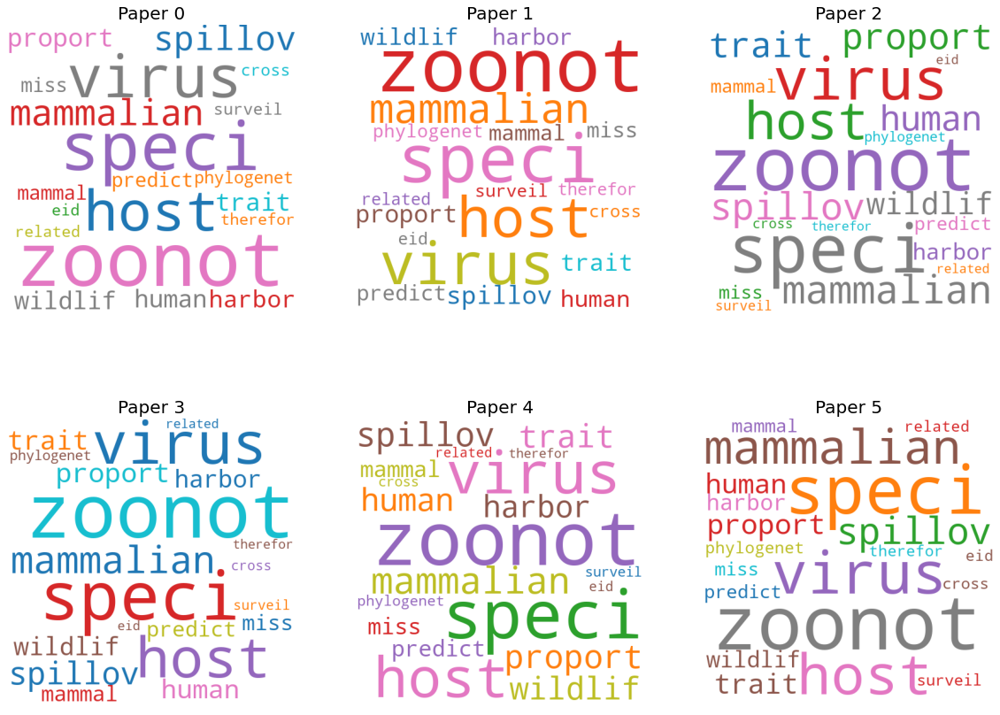

In [15]:
display_topics_results("What do we know about diagnostics and surveillance?")